## 3C CITATION CONTEXT CLASSIFICATION


## Team 18

### Required Packages

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
import nltk
import itertools
nltk.download('stopwords')
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
import re #regular expression
from sklearn import metrics
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.naive_bayes import GaussianNB
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn import svm
import seaborn as sns
import matplotlib.pyplot as plt;plt.rcdefaults()

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\LENOVO\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [3]:
import ipywidgets as widgets
from ipywidgets import interact, interact_manual

### Importing Dataset:

In [4]:
df=pd.read_csv('C:\\Users\\LENOVO\\Desktop\\AI2.0\\Sem-3\\Python for ML\\Citation classification task\\train.csv')

##### Adding style to the dataframe

In [5]:
df.style.set_properties(**{'background-color': 'black',
                           'color': 'cyan',
                           'border-color': 'white'})

### Slider for viewing the dataframe based on core_id

In [6]:
@interact
def show_articles_more_than(column='core_id', x=79794290):
    return df.loc[df[column] > x]

interactive(children=(Text(value='core_id', description='column'), IntSlider(value=79794290, description='x', …

In [7]:
df.head()

,unique_id,core_id,citing_title,citing_author,cited_title,cited_author,citation_context,citation_influence_label
0,CC1,158977742,Ontology-Based Recommendation of Editorial Pro...,Thiviyan Thanapalasingam,Web search personalization with ontological us...,Sieg,They usually generate user models that describ...,0
1,CC2,158977742,Ontology-Based Recommendation of Editorial Pro...,Thiviyan Thanapalasingam,Exploring Scholarly Data with Rexplore,Osborne,The Computer Science Ontology (CSO)[3]is a lar...,0
2,CC3,158977742,Ontology-Based Recommendation of Editorial Pro...,Thiviyan Thanapalasingam,Klink-2: Integrating Multiple Web Sources to G...,Osborne,"In order to do so, we characterized all SN pub...",0
3,CC4,158977742,Ontology-Based Recommendation of Editorial Pro...,Thiviyan Thanapalasingam,Forecasting the Spreading of Technologies in R...,Osborne,"This API supports a number of applications, in...",1
4,CC5,158977742,Ontology-Based Recommendation of Editorial Pro...,Thiviyan Thanapalasingam,Supporting Springer Nature Editors by means of...,Osborne,It works according to three main steps:1) It r...,1


In [8]:
df.shape

(3000, 8)

In [9]:
df.describe()

,core_id,citation_influence_label
count,3.000000e+03,3000.000000
mean,5.799004e+07,0.477333
std,6.130802e+07,0.499569
min,1.457900e+04,0.000000
25%,3.078086e+07,0.000000
50%,5.585356e+07,0.000000
75%,8.185774e+07,1.000000
max,2.791772e+09,1.000000


In [10]:
#To get the independent features
#X=df.drop('citation_influence_label',axis=1)
X=df['citation_context']
text=df['citation_context']#this for word  cloud

In [11]:
X.head()

0    They usually generate user models that describ...
1    The Computer Science Ontology (CSO)[3]is a lar...
2    In order to do so, we characterized all SN pub...
3    This API supports a number of applications, in...
4    It works according to three main steps:1) It r...
Name: citation_context, dtype: object

In [12]:
#To get the dependent features

y=df['citation_influence_label']

In [13]:
y.head()

0    0
1    0
2    0
3    1
4    1
Name: citation_influence_label, dtype: int64

In [14]:
df.shape# 8 features and 3000 rows

(3000, 8)

### Text pre-processing using CountVectorizer(bag of words),Tf-idf

In [15]:
# text pre processing:
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer

In [16]:
df=df.dropna() # to drop nan values

In [17]:
df.shape

(3000, 8)

In [18]:
message=df.copy()#copying the dataframe and storing it in the message

In [19]:
message.reset_index(inplace=True)#this is done inorder to maintain the index after removing the nan values.
#also it wont cause a problem while iterating through the for loop.

In [20]:
#message.head(10)

In [21]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\LENOVO\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [22]:
#blow:to remove all stop words /special characters
#stopwords-less important words.
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
import re #regular expression
ps = PorterStemmer()
corpus = []
for i in range(0, len(message)):
    review = re.sub('[^a-zA-Z]', ' ', message['citing_title'][i])
    review = review.lower()
    review = review.split()#becoz after this we need to apply s.w and stemming 
    
    review = [ps.stem(word) for word in review if not word in stopwords.words('english')]
    review = ' '.join(review)#combining all spaces with join function
    corpus.append(review)

In [23]:
#stopwords.words('german')

In [24]:
corpus

['ontolog base recommend editori product',
 'ontolog base recommend editori product',
 'ontolog base recommend editori product',
 'ontolog base recommend editori product',
 'ontolog base recommend editori product',
 'ontolog base recommend editori product',
 'ontolog base recommend editori product',
 'ontolog base recommend editori product',
 'ontolog base recommend editori product',
 'ontolog base recommend editori product',
 'ontolog base recommend editori product',
 'ontolog base recommend editori product',
 'ontolog base recommend editori product',
 'ontolog base recommend editori product',
 'ontolog base recommend editori product',
 'ontolog base recommend editori product',
 'ontolog base recommend editori product',
 'ontolog base recommend editori product',
 'ontolog base recommend editori product',
 'ontolog base recommend editori product',
 'co design card social issu creat educ game',
 'co design card social issu creat educ game',
 'co design card social issu creat educ game',

In [25]:
#now we apply Tfidf vectorizer
#Also create bag of words
## TFidf Vectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf_v=TfidfVectorizer(max_features=5000,ngram_range=(1,3))#take the most 5000 most occuring words
X=tfidf_v.fit_transform(corpus).toarray()
#ngram denotrs -take 2 word,3 words as featutre .

In [26]:
X.shape#we get same no of records but we hv 2892 features

(3000, 2892)

In [27]:
y=message['citation_influence_label']#output feature

In [28]:
## Divide the dataset into Train and Test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=0)

In [29]:
#top 20 feature name using ngram(combination of words)
tfidf_v.get_feature_names()[:20]

['abund',
 'abund solar',
 'abund solar analog',
 'access',
 'account',
 'account role',
 'account role cognit',
 'accumul',
 'accumul mutat',
 'accumul mutat tumor',
 'achiev',
 'achiev climat',
 'achiev climat polici',
 'acquir',
 'acquir like',
 'acquir like dislik',
 'acquisit',
 'acquisit case',
 'acquisit case institut',
 'action']

In [30]:
tfidf_v.get_params()#it tells the information for the method we used.

{'analyzer': 'word',
 'binary': False,
 'decode_error': 'strict',
 'dtype': numpy.float64,
 'encoding': 'utf-8',
 'input': 'content',
 'lowercase': True,
 'max_df': 1.0,
 'max_features': 5000,
 'min_df': 1,
 'ngram_range': (1, 3),
 'norm': 'l2',
 'preprocessor': None,
 'smooth_idf': True,
 'stop_words': None,
 'strip_accents': None,
 'sublinear_tf': False,
 'token_pattern': '(?u)\\b\\w\\w+\\b',
 'tokenizer': None,
 'use_idf': True,
 'vocabulary': None}

In [31]:
count_df = pd.DataFrame(X_train, columns=tfidf_v.get_feature_names())

In [32]:
count_df.head()

,abund,abund solar,abund solar analog,access,account,account role,account role cognit,accumul,accumul mutat,accumul mutat tumor,...,workshop tel aviv,world,world salmon,world salmon price,year,year cape,year cape cod,young,young peopl,young peopl popular
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Evaluation Metrics for various Algorithms and its corresponding plots:


### 1)Gausian Navie bayes

In [33]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()
gnb.fit(X_train, y_train)

GaussianNB(priors=None, var_smoothing=1e-09)

In [34]:
y_pred_gnb = gnb.predict(X_test)
# print(y_pred)

In [35]:
conf_mat = confusion_matrix(y_test, y_pred_gnb) # Confusion matrix
accuracy_gnb = accuracy_score(y_test, y_pred_gnb) # Accuracy of prediction
precision_gnb = precision_score(y_test, y_pred_gnb, average='macro') # Precision
recall = recall_score(y_test, y_pred_gnb, average='macro') # Recall
f1 = f1_score(y_test, y_pred_gnb, average='macro') # F1-score


In [36]:
print("Confusion matrix:\n", conf_mat)
print("Accuracy = ", "{0:.2}".format(accuracy_gnb*100))  # Fixing the decimal precision to 2 values
print("Precision = ", "{0:.4}".format(precision_gnb))
print("Recall = ", "{0:.4}".format(recall))
print("F1-score = ", "{0:.4}".format(f1))

Confusion matrix:
 [[213 287]
 [ 91 399]]
Accuracy =  6.2e+01
Precision =  0.6411
Recall =  0.6201
F1-score =  0.6042


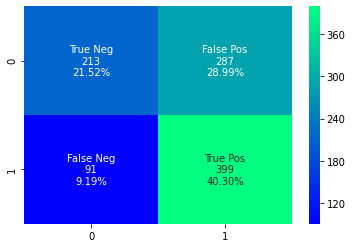

In [37]:
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                conf_mat.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in conf_mat.flatten()/np.sum(conf_mat)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(conf_mat, annot=labels, fmt='', cmap='winter')

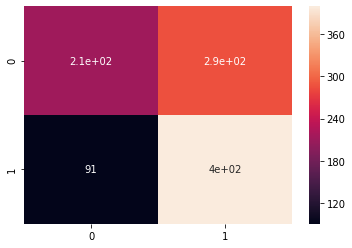

In [38]:
import seaborn as sns
sns.heatmap(conf_mat, annot=True)

### 2)MultinomialNB Algorithm

In [39]:
clf_mnb=MultinomialNB()
clf_mnb.fit(X_train, y_train)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [40]:
y_pred_mnb=clf_mnb.predict(X_test)

In [41]:
conf_mat = confusion_matrix(y_test,y_pred_mnb) # Confusion matrix
accuracy_mnb = accuracy_score(y_test,y_pred_mnb) # Accuracy of prediction
precision_mnb = precision_score(y_test,y_pred_mnb, average='macro') # Precision
recall = recall_score(y_test,y_pred_mnb, average='macro') # Recall
f1 = f1_score(y_test,y_pred_mnb, average='macro') # F1-score

In [42]:
print("Confusion matrix:\n", conf_mat)
print("Accuracy = ", "{0:.2}".format(accuracy_mnb*100))  # Fixing the decimal precision to 2 values
print("Precision = ", "{0:.4}".format(precision_mnb))
print("Recall = ", "{0:.4}".format(recall))
print("F1-score = ", "{0:.4}".format(f1))

Confusion matrix:
 [[342 158]
 [177 313]]
Accuracy =  6.6e+01
Precision =  0.6618
Recall =  0.6614
F1-score =  0.6613


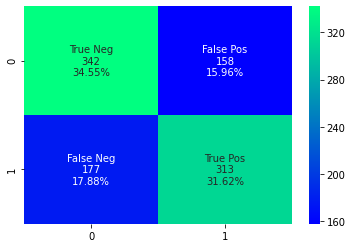

In [43]:
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                conf_mat.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in conf_mat.flatten()/np.sum(conf_mat)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(conf_mat, annot=labels, fmt='', cmap='winter')

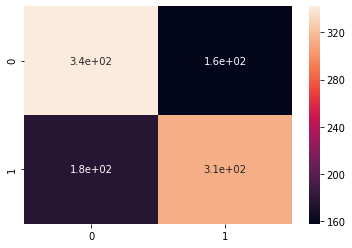

In [44]:
import seaborn as sns
sns.heatmap(conf_mat, annot=True)

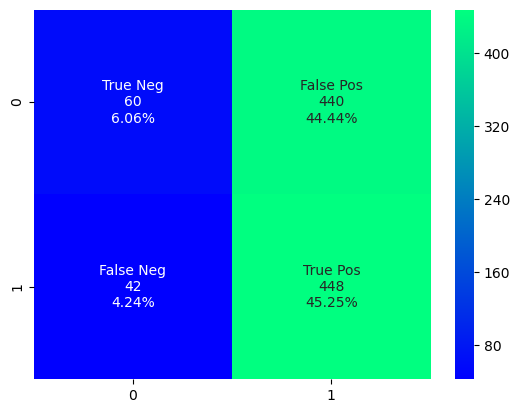

In [56]:
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                conf_mat.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in conf_mat.flatten()/np.sum(conf_mat)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(conf_mat, annot=labels, fmt='', cmap='winter')

### 4)Decision Tree

In [45]:
clf_dt = DecisionTreeClassifier(criterion='gini', splitter='best', max_depth=3, class_weight='balanced')
clf_dt.fit(X_train, y_train)





DecisionTreeClassifier(class_weight='balanced', criterion='gini', max_depth=3,
                       max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort=False,
                       random_state=None, splitter='best')

In [46]:
# Predicting the labels for test data
y_pred_dt = clf_dt.predict(X_test)
# print(y_pred)



[0 1]
[0. 0. 0. ... 0. 0. 0.]


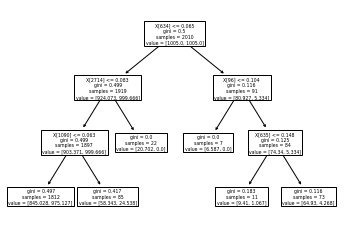

In [47]:
print(clf_dt.classes_) # A list of arrays of class labels
print(clf_dt.feature_importances_) # Importance of each features in splitting
plot_tree(clf_dt)  # Plotting the decision tree
plt.show()



In [48]:
conf_mat = confusion_matrix(y_test, y_pred_dt) # Confusion matrix
accuracy_dt = accuracy_score(y_test, y_pred_dt) # Accuracy of prediction
precision_dt = precision_score(y_test,y_pred_dt, average='macro') # Precision
recall = recall_score(y_test, y_pred_dt, average='macro') # Recall
f1 = f1_score(y_test,y_pred_dt, average='macro') # F1-score


In [49]:
print("Confusion matrix:\n", conf_mat)
print("Accuracy = ", "{0:.2}".format(accuracy_dt*100))  # Fixing the decimal precision to 2 values
print("Precision = ", "{0:.4}".format(precision_dt))
print("Recall = ", "{0:.4}".format(recall))
print("F1-score = ", "{0:.4}".format(f1))

Confusion matrix:
 [[ 79 421]
 [ 25 465]]
Accuracy =  5.5e+01
Precision =  0.6422
Recall =  0.5535
F1-score =  0.4687


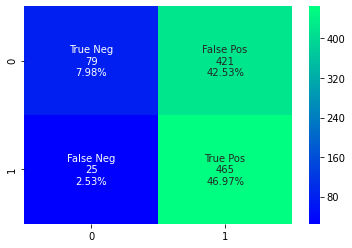

In [50]:
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                conf_mat.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in conf_mat.flatten()/np.sum(conf_mat)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(conf_mat, annot=labels, fmt='', cmap='winter')

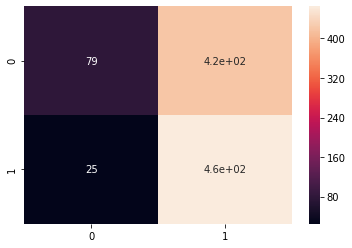

In [51]:
import seaborn as sns
sns.heatmap(conf_mat, annot=True)

accuracy:   0.549
Confusion matrix, without normalization


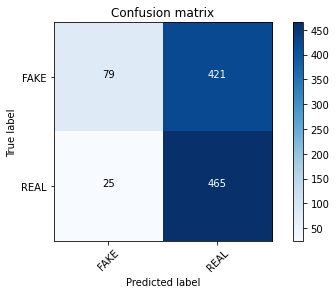

In [54]:
clf_dt.fit(X_train, y_train)
pred = clf_dt.predict(X_test)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred)
plot_confusion_matrix(cm, classes=['FAKE', 'REAL'])#run plot confusion matrix below

### 5)KNN

In [55]:
clf_knn = KNeighborsClassifier(n_neighbors=5, weights='uniform')
clf_knn.fit(X_train, y_train)


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')

In [56]:
# Predicting the labels for test data
y_pred_knn = clf_knn.predict(X_test)
# print(y_pred)

In [57]:
conf_mat = confusion_matrix(y_test, y_pred_knn ) # Confusion matrix
accuracy_knn = accuracy_score(y_test, y_pred_knn ) # Accuracy of prediction
precision_knn = precision_score(y_test, y_pred_knn , average='macro') # Precision
recall = recall_score(y_test,y_pred_knn , average='macro') # Recall
f1 = f1_score(y_test,y_pred_knn , average='macro') # F1-score



In [58]:
print("Confusion matrix:\n", conf_mat)
print("Accuracy = ", "{0:.2}".format(accuracy_knn*100))  # Fixing the decimal precision to 2 values
print("Precision = ", "{0:.4}".format(precision_knn))
print("Recall = ", "{0:.4}".format(recall))
print("F1-score = ", "{0:.4}".format(f1))

Confusion matrix:
 [[317 183]
 [159 331]]
Accuracy =  6.5e+01
Precision =  0.655
Recall =  0.6548
F1-score =  0.6545


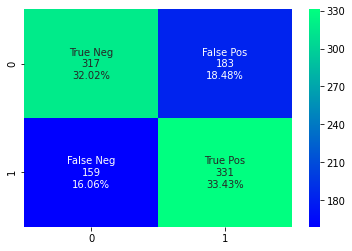

In [59]:
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                conf_mat.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in conf_mat.flatten()/np.sum(conf_mat)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(conf_mat, annot=labels, fmt='', cmap='winter')

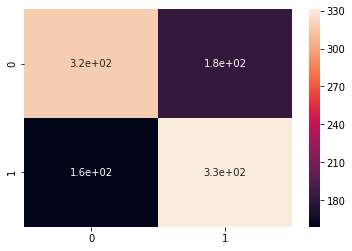

In [60]:
import seaborn as sns
sns.heatmap(conf_mat, annot=True)

accuracy:   0.655
Confusion matrix, without normalization


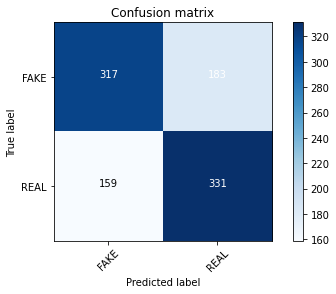

In [61]:
clf_knn.fit(X_train, y_train)
pred = clf_knn.predict(X_test)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred)
plot_confusion_matrix(cm, classes=['FAKE', 'REAL'])

### 6)Random Forest Algorithm

In [62]:
clf_rf =RandomForestClassifier()
clf_rf.fit(X_train, y_train)


C:\Users\LENOVO\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
                       max_depth=None, max_features='auto', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=10,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

In [63]:
y_pred_rf = clf_rf.predict(X_test)

In [64]:
conf_mat = confusion_matrix(y_test, y_pred_rf) # Confusion matrix
accuracy_rf = accuracy_score(y_test, y_pred_rf) # Accuracy of prediction
precision_rf = precision_score(y_test, y_pred_rf, average='macro') # Precision
recall = recall_score(y_test,y_pred_rf, average='macro') # Recall
f1 = f1_score(y_test, y_pred_rf, average='macro') # F1-score



In [65]:
print("Confusion matrix:\n", conf_mat)
print("Accuracy = ", "{0:.2}".format(accuracy_rf*100))  # Fixing the decimal precision to 2 values
print("Precision = ", "{0:.4}".format(precision_rf))
print("Recall = ", "{0:.4}".format(recall))
print("F1-score = ", "{0:.4}".format(f1))

Confusion matrix:
 [[348 152]
 [190 300]]
Accuracy =  6.5e+01
Precision =  0.6553
Recall =  0.6541
F1-score =  0.6537


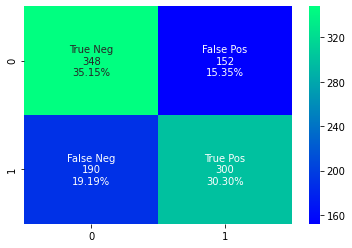

In [66]:
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                conf_mat.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in conf_mat.flatten()/np.sum(conf_mat)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(conf_mat, annot=labels, fmt='', cmap='winter')

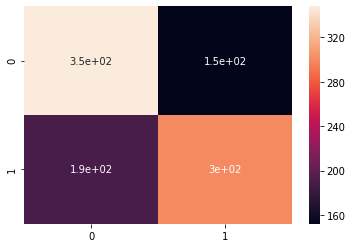

In [67]:
import seaborn as sns
sns.heatmap(conf_mat, annot=True)

accuracy:   0.654
Confusion matrix, without normalization


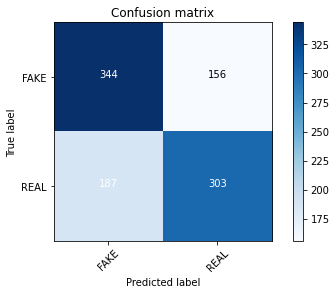

In [68]:
clf_rf.fit(X_train, y_train)
pred = clf_rf.predict(X_test)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred)
plot_confusion_matrix(cm, classes=['FAKE', 'REAL'])

### 7)SVM

In [69]:
clf_svm=svm.SVC()#Suport vector classification
clf_svm.fit(X_train, y_train)

C:\Users\LENOVO\Anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


SVC(C=1.0, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='auto_deprecated',
    kernel='rbf', max_iter=-1, probability=False, random_state=None,
    shrinking=True, tol=0.001, verbose=False)

In [70]:
y_pred_svm = clf_svm.predict(X_test)

In [71]:
conf_mat = confusion_matrix(y_test, y_pred_svm) # Confusion matrix
accuracy_svm = accuracy_score(y_test,y_pred_svm) # Accuracy of prediction
precision_svm = precision_score(y_test, y_pred_svm, average='macro') # Precision
recall = recall_score(y_test,y_pred_svm, average='macro') # Recall
f1 = f1_score(y_test,y_pred_svm, average='macro') # F1-score

C:\Users\LENOVO\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\LENOVO\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [72]:
print("Confusion matrix:\n", conf_mat)
print("Accuracy = ", "{0:.2}".format(accuracy_svm*100))  # Fixing the decimal precision to 2 values
print("Precision = ", "{0:.4}".format(precision_svm))
print("Recall = ", "{0:.4}".format(recall))
print("F1-score = ", "{0:.4}".format(f1))

Confusion matrix:
 [[500   0]
 [490   0]]
Accuracy =  5.1e+01
Precision =  0.2525
Recall =  0.5
F1-score =  0.3356


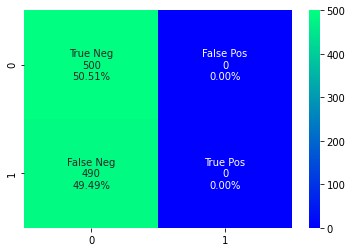

In [73]:
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ["{0:0.0f}".format(value) for value in
                conf_mat.flatten()]
group_percentages = ["{0:.2%}".format(value) for value in conf_mat.flatten()/np.sum(conf_mat)]
labels = [f"{v1}\n{v2}\n{v3}" for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(conf_mat, annot=labels, fmt='', cmap='winter')

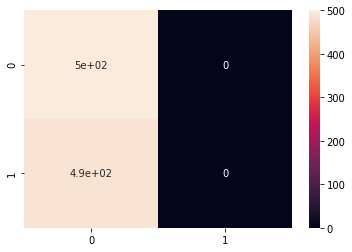

In [74]:
import seaborn as sns
sns.heatmap(conf_mat, annot=True)

C:\Users\LENOVO\Anaconda3\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


accuracy:   0.505
Confusion matrix, without normalization


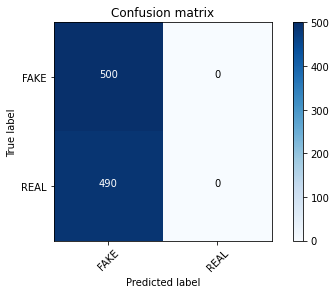

In [75]:
clf_svm.fit(X_train, y_train)
pred = clf_svm.predict(X_test)
score = metrics.accuracy_score(y_test, pred)
print("accuracy:   %0.3f" % score)
cm = metrics.confusion_matrix(y_test, pred)
plot_confusion_matrix(cm, classes=['FAKE', 'REAL'])

### To plot normalized or unormalized confusion matrix

In [76]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

### Word Cloud to represent the citation context

In [77]:
text=text.to_string()

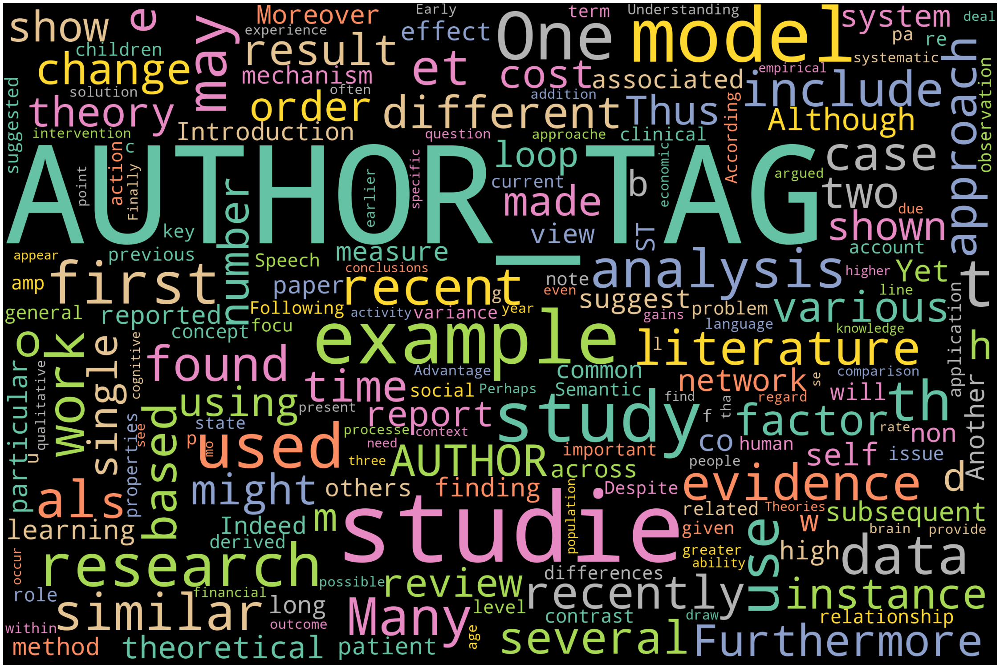

In [78]:
# Import packages
import matplotlib.pyplot as plt
%matplotlib inline
# Define a function to plot word cloud
def plot_cloud(wordcloud):
    # Set figure size
    plt.figure(figsize=(40, 30))
    # Display image
    plt.imshow(wordcloud) 
    # No axis details
    plt.axis("off")
from wordcloud import WordCloud, STOPWORDS
# Generate word cloud
wordcloud = WordCloud(width = 3000, height = 2000, random_state=1, background_color='black', colormap='Set2', collocations=False, stopwords = STOPWORDS).generate(text)
# Plot
plot_cloud(wordcloud)

## Result Comparison(Selecting Best Algorithm)

## Accuracy comparison

In [79]:
print("Accuracy of Gausian Navie bayes: ",accuracy_gnb*100)
print("Accuracy of Multinomial Navie bayes: ",accuracy_mnb*100)
print("Accuracy of KNN: ",accuracy_knn*100)
#print("Accuracy of Kmeans: ",accuracy_km*100)
print("Accuracy of SVM: ",accuracy_svm*100)
print("Accuracy of Random Forest: ",accuracy_rf*100)
print("Accuracy of Decision Tree: ",accuracy_dt*100)

Accuracy of Gausian Navie bayes:  61.81818181818181
Accuracy of Multinomial Navie bayes:  66.16161616161617
Accuracy of KNN:  65.45454545454545
Accuracy of SVM:  50.505050505050505
Accuracy of Random Forest:  65.45454545454545
Accuracy of Decision Tree:  54.94949494949495


### Pie chart comparison

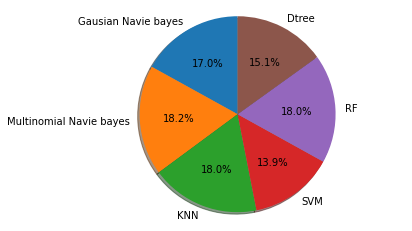

In [80]:
labels = 'Gausian Navie bayes', 'Multinomial Navie bayes', 'KNN','SVM','RF','Dtree'
#sizes = [61.81818181818181, 66.16161616161617,65.45454545454545, 46.96969696969697,50.505050505050505]
sizes1 = [accuracy_gnb,accuracy_mnb,accuracy_knn,accuracy_svm,accuracy_rf,accuracy_dt]

fig1, ax1 = plt.subplots()
ax1.pie(sizes1,labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

### Bar-chart camparison

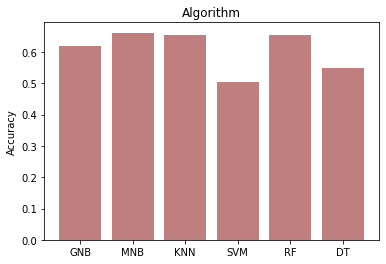

In [81]:
Algo = ('GNB', 'MNB', 'KNN','SVM','RF','DT')
y_pos = np.arange(len(Algo))
performance = [accuracy_gnb,accuracy_mnb,accuracy_knn,accuracy_svm,accuracy_rf,accuracy_dt]

plt.bar(y_pos, performance, align='center', alpha=0.5,color='maroon')
plt.xticks(y_pos, Algo)
plt.ylabel('Accuracy')
plt.title('Algorithm')

plt.show()

## Precision comparison

In [82]:
print("Precision of Gausian Navie bayes: ",precision_gnb*100)
print("Precisionof Multinomial Navie bayes: ",precision_mnb*100)
print("Precision of KNN: ",precision_knn*100)
#print("Precision of Kmeans: ",precision_km*100)
print("Precision of SVM: ",precision_svm*100)
print("Precision of Random Forest: ",precision_rf*100)
print("Precision of Decision Tree: ",precision_dt*100)

Precision of Gausian Navie bayes:  64.11452738990333
Precisionof Multinomial Navie bayes:  66.1751530994195
Precision of KNN:  65.49676290749763
Precision of SVM:  25.252525252525253
Precision of Random Forest:  65.52784814290884
Precision of Decision Tree:  64.22230421948254


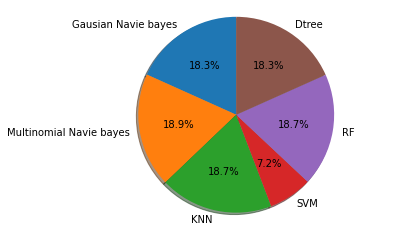

In [84]:
labels ='Gausian Navie bayes', 'Multinomial Navie bayes', 'KNN','SVM','RF','Dtree'
#sizes = [61.81818181818181, 66.16161616161617,65.45454545454545, 46.96969696969697,50.505050505050505]
sizes2 = [precision_gnb,precision_mnb,precision_knn,precision_svm,precision_rf,precision_dt]

fig1, ax1 = plt.subplots()
ax1.pie(sizes2,labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

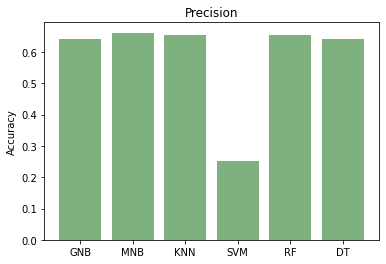

In [85]:
Algo = ('GNB', 'MNB', 'KNN','SVM','RF','DT')
y_pos = np.arange(len(Algo))
performance = [precision_gnb,precision_mnb,precision_knn,precision_svm,precision_rf,precision_dt]

plt.bar(y_pos, performance, align='center', alpha=0.5,color='darkgreen')
plt.xticks(y_pos, Algo)
plt.ylabel('Accuracy')
plt.title('Precision')

plt.show()

# CONCLUSION:
#### M.Navie Bayes > KNN > Randon Forest > G.Naive Bayes > Desicion Tree > SVM